# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

In [1]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'

fileNames = ["jet.png", "kw.png", "moon.png", "lenaSzum.png", "lena.png", "plansza.png"]
for fileName in fileNames:
  if not os.path.exists(fileName):
      r = requests.get(url + fileName, allow_redirects=True)
      open(fileName, 'wb').write(r.content)

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

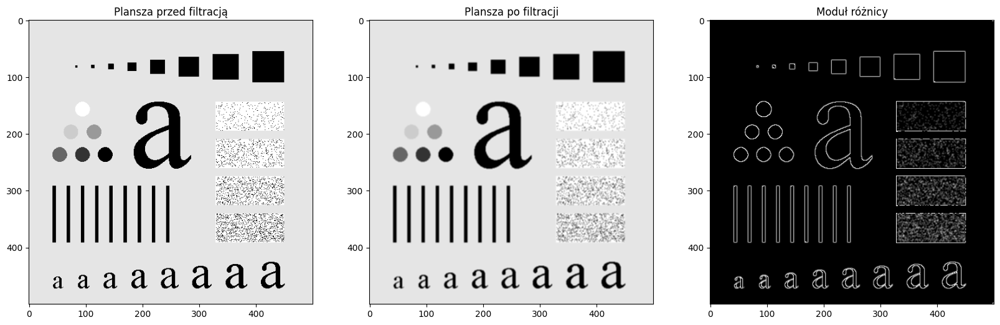

In [41]:
plansza = cv2.imread('plansza.png')
plansza = cv2.cvtColor(plansza, cv2.COLOR_BGR2GRAY) 


kernel = np.ones((3, 3), np.float32) / 9

plansza_filtered = cv2.filter2D(src = plansza, ddepth = -1, kernel=kernel)

fig, ax = plt.subplots(1, 3, figsize = (20, 20))


ax[0].imshow(plansza, cmap='grey')
ax[0].set_title("Plansza przed filtracją")


ax[1].imshow(plansza_filtered, cmap='grey')
ax[1].set_title("Plansza po filtracji")

ax[2].imshow(np.abs(plansza - plansza_filtered), cmap='grey')
ax[2].set_title("Moduł różnicy")

plt.show()

5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

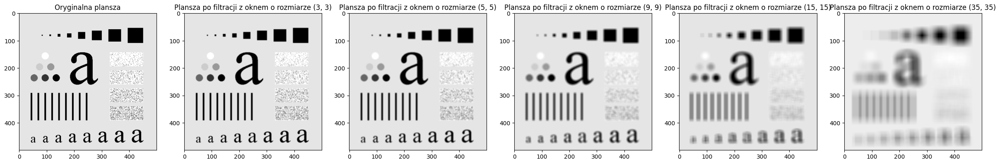

In [43]:
kernels_sizes = [(3,3), (5,5), (9,9), (15,15), (35,35)]

fig, ax = plt.subplots(1, 6, figsize=(30, 30))

ax[0].imshow(plansza, cmap='grey')
ax[0].set_title("Oryginalna plansza")

for i, kernel_size in enumerate(kernels_sizes):
    kernel = np.ones(kernel_size, np.float32) / (kernel_size[0] * kernel_size[1])
    plansza_filtered = cv2.filter2D(src = plansza, ddepth = -1, kernel=kernel)
    ax[i + 1].imshow(plansza_filtered, cmap='grey')
    ax[i + 1].set_title(f"Plansza po filtracji z oknem o rozmiarze {kernel_size}")

plt.show()


6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

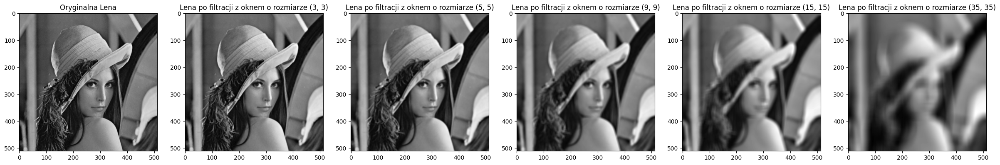

In [44]:
lena = cv2.imread('lena.png')
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)

kernels_sizes = [(3,3), (5,5), (9,9), (15,15), (35,35)]

fig, ax = plt.subplots(1, 6, figsize=(30, 30))

ax[0].imshow(lena, cmap='grey')
ax[0].set_title("Oryginalna Lena")

for i, kernel_size in enumerate(kernels_sizes):
    kernel = np.ones(kernel_size, np.float32) / (kernel_size[0] * kernel_size[1])
    lena_filtered = cv2.filter2D(src = lena, ddepth = -1, kernel=kernel)
    ax[i + 1].imshow(lena_filtered, cmap='grey')
    ax[i + 1].set_title(f"Lena po filtracji z oknem o rozmiarze {kernel_size}")

plt.show()


7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

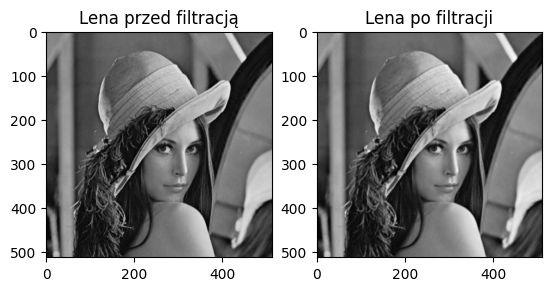

In [45]:
kernel = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]], dtype=np.float32)

kernel /= np.sum(kernel)

lena_filtered = cv2.filter2D(src = lena, ddepth = -1, kernel = kernel)

fig, ax = plt.subplots(1, 2)

ax[0].imshow(lena, cmap='grey')
ax[0].set_title("Lena przed filtracją")

ax[1].imshow(lena_filtered, cmap='grey')
ax[1].set_title("Lena po filtracji")

plt.show()

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

In [6]:
def fgaussian(size, sigma):
     m = n = size
     h, k = m//2, n//2
     x, y = np.mgrid[-h:h+1, -k:k+1]
     g = np.exp(-(x**2 + y**2)/(2*sigma**2))
     return g /g.sum() 
    
    
def mesh(fun, size):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    

    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z)
    
    plt.show()

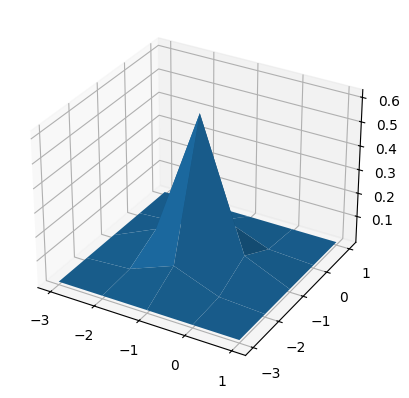

In [7]:
kernel = fgaussian(5, 0.5)
mesh(kernel, 5)

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.

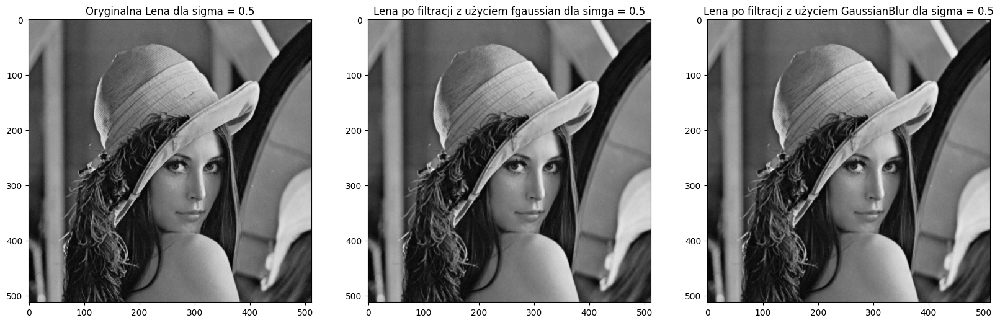

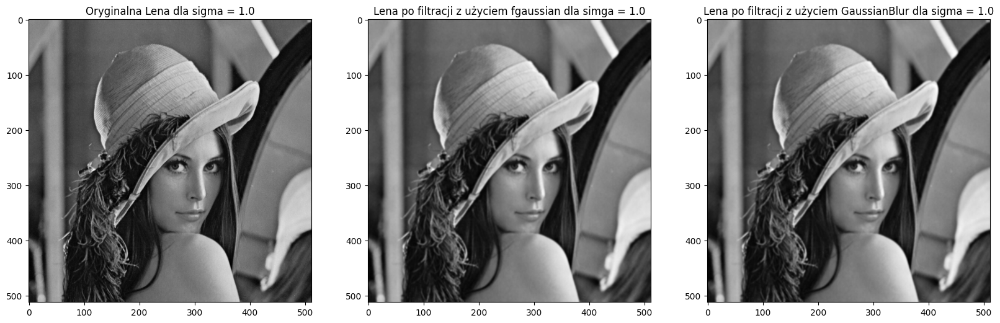

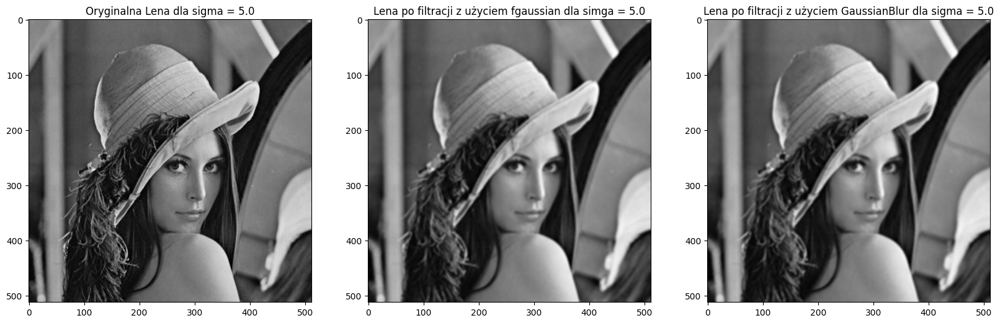

In [46]:
sigmas = [0.5, 1.0, 5.0]

for sigma in sigmas:

    kernel_1 = fgaussian(5, sigma)

    lena_filtered_1 = cv2.filter2D(src=lena, ddepth=-1, kernel = kernel_1)

    lena_filtered_2 = cv2.GaussianBlur(lena, (5, 5), sigma)

    fig, ax = plt.subplots(1, 3, figsize = (20, 15))

    ax[0].imshow(lena, cmap='grey')
    ax[0].set_title(f"Oryginalna Lena dla sigma = {sigma}")

    ax[1].imshow(lena_filtered_1, cmap='grey')
    ax[1].set_title(f"Lena po filtracji z użyciem fgaussian dla simga = {sigma}")

    ax[2].imshow(lena_filtered_2, cmap='grey')
    ax[2].set_title(f"Lena po filtracji z użyciem GaussianBlur dla sigma = {sigma}")

    plt.show()




### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.
  
2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

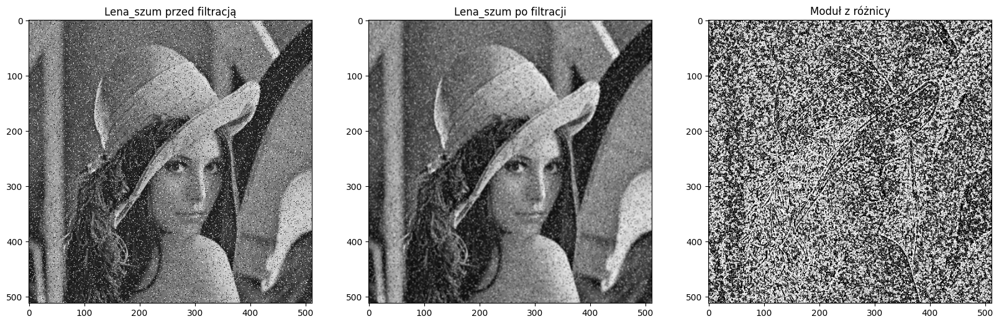

In [47]:
lena_szum = cv2.imread('lenaSzum.png')
lena_szum = cv2.cvtColor(lena_szum, cv2.COLOR_BGR2GRAY)

kernel = np.ones((3, 3), dtype=np.float32) / 9

lena_szum_filtered = cv2.filter2D(src=lena_szum, ddepth=-1, kernel=kernel)

fig, ax = plt.subplots(1, 3, figsize = (20, 15))

ax[0].imshow(lena_szum, cmap='grey')
ax[0].set_title("Lena_szum przed filtracją")

ax[1].imshow(lena_szum_filtered, cmap='grey')
ax[1].set_title("Lena_szum po filtracji")

ax[2].imshow(np.abs(lena_szum - lena_szum_filtered), cmap='grey')
ax[2].set_title("Moduł z różnicy")

plt.show()

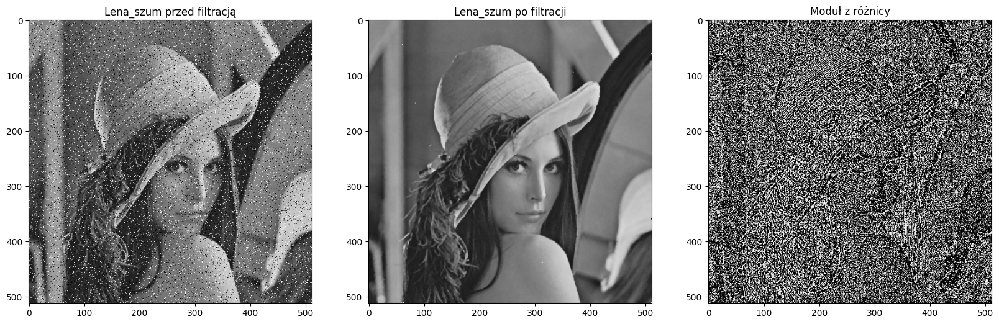

In [48]:
lena_szum_blur_filtered = cv2.medianBlur(lena_szum, 3)

fig, ax = plt.subplots(1, 3, figsize=(20, 15))

ax[0].imshow(lena_szum, cmap='grey')
ax[0].set_title("Lena_szum przed filtracją")

ax[1].imshow(lena_szum_blur_filtered, cmap='grey')
ax[1].set_title("Lena_szum po filtracji")

ax[2].imshow(np.abs(lena_szum - lena_szum_blur_filtered), cmap='grey')
ax[2].set_title("Moduł z różnicy")

plt.show()

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

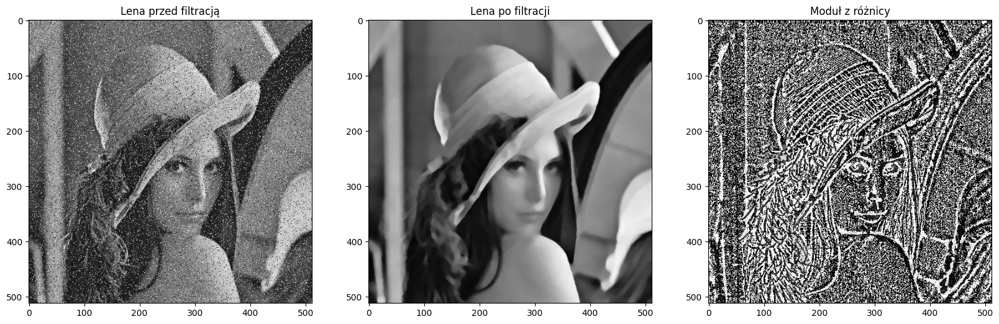

In [51]:
lena_szum_loop = cv2.imread('lenaSzum.png')
lena_szum_loop = cv2.cvtColor(lena_szum_loop, cv2.COLOR_BGR2GRAY)

for i in range(10):
    lena_szum_loop = cv2.medianBlur(lena_szum_loop, 5)

fig, ax = plt.subplots(1, 3, figsize = (20, 15))

ax[0].imshow(lena_szum, cmap='grey')
ax[0].set_title('Lena przed filtracją')

ax[1].imshow(lena_szum_loop, cmap='grey')
ax[1].set_title('Lena po filtracji')


ax[2].imshow(np.abs(lena_szum - lena_szum_loop), cmap='grey')
ax[2].set_title('Moduł z różnicy')

plt.show()

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

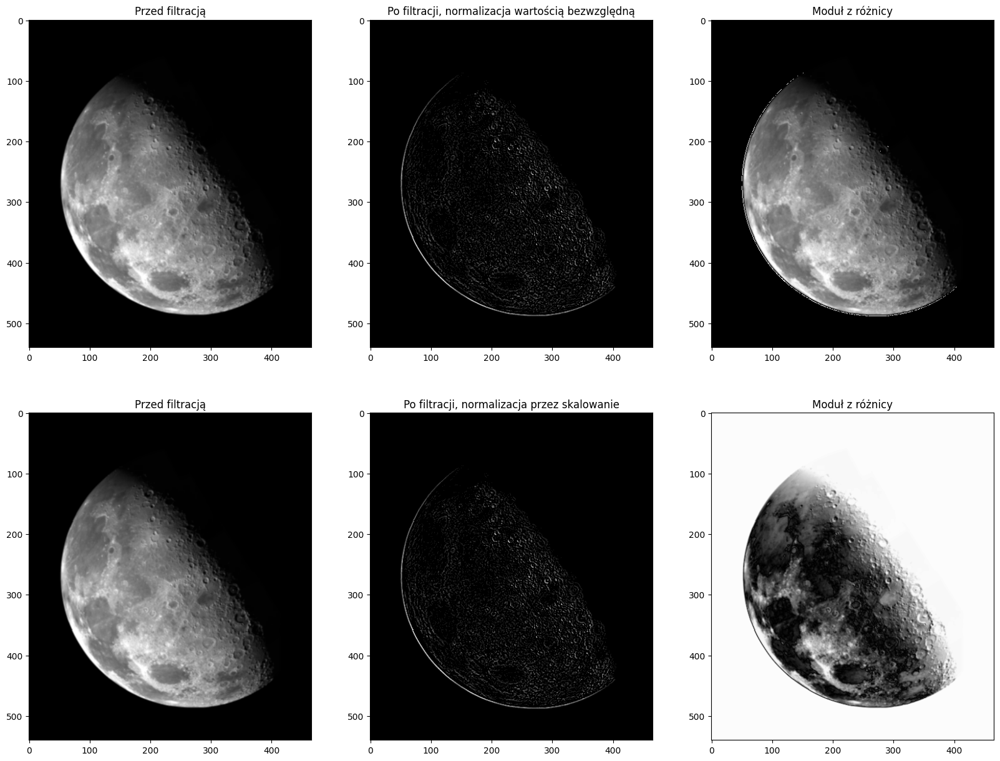

In [57]:
moon = cv2.imread('moon.png')
moon = cv2.cvtColor(moon, cv2.COLOR_BGR2GRAY) 

M = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]], dtype=np.float32) / 9

moon_filtered = cv2.filter2D(src=moon, ddepth=-1, kernel=M)

moon_filtered_normalization_abs = np.abs(moon_filtered)
moon_filtered_normalization_scale = moon_filtered.astype('int16') + 128

fig, ax = plt.subplots(2, 3, figsize = (20, 15))

ax[0][0].imshow(moon, cmap='grey')
ax[0][0].set_title('Przed filtracją')

ax[0][1].imshow(moon_filtered_normalization_abs, cmap='grey')
ax[0][1].set_title('Po filtracji, normalizacja wartością bezwzględną')

ax[0][2].imshow(np.abs(moon - moon_filtered_normalization_abs), cmap='grey')
ax[0][2].set_title('Moduł z różnicy')

ax[1][0].imshow(moon, cmap='grey')
ax[1][0].set_title('Przed filtracją')

ax[1][1].imshow(moon_filtered_normalization_scale, cmap='grey')
ax[1][1].set_title('Po filtracji, normalizacja przez skalowanie')

ax[1][2].imshow(np.abs(moon - moon_filtered_normalization_scale), cmap='grey')
ax[1][2].set_title('Moduł z różnicy')

plt.show()

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



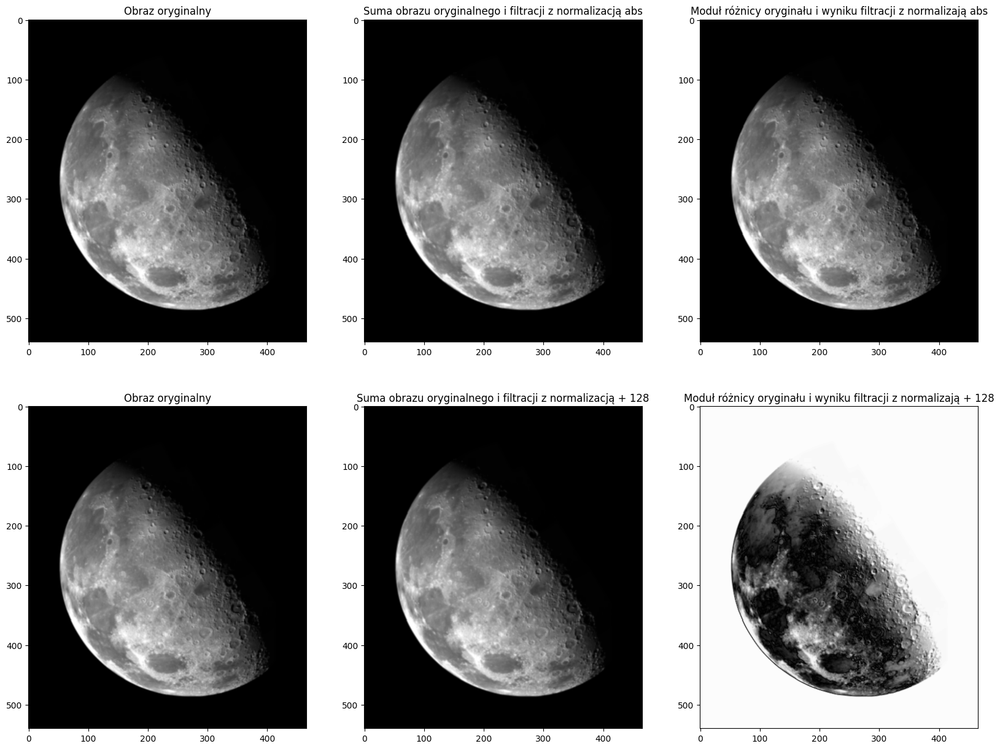

In [56]:
moon_int = moon.astype('int16')
moon_filtered_normalization_abs_int = moon_filtered_normalization_abs.astype('int16')
moon_filtered_normalization_scale_int = moon_filtered_normalization_scale.astype('int16')

fig, ax = plt.subplots(2, 3, figsize = (20, 15))

ax[0][0].imshow(moon, cmap='grey')
ax[0][0].set_title('Obraz oryginalny')

ax[0][1].imshow(moon + moon_filtered_normalization_abs_int, cmap='grey')
ax[0][1].set_title("Suma obrazu oryginalnego i filtracji z normalizacją abs")

ax[0][2].imshow(np.abs(moon - moon_filtered_normalization_abs_int), cmap='grey')
ax[0][2].set_title("Moduł różnicy oryginału i wyniku filtracji z normalizają abs")

ax[1][0].imshow(moon, cmap='grey')
ax[1][0].set_title('Obraz oryginalny')

ax[1][1].imshow(moon + moon_filtered_normalization_scale_int, cmap='grey')
ax[1][1].set_title("Suma obrazu oryginalnego i filtracji z normalizacją + 128")

ax[1][2].imshow(np.abs(moon - moon_filtered_normalization_scale_int), cmap='grey')
ax[1][2].set_title("Moduł różnicy oryginału i wyniku filtracji z normalizają + 128")


plt.show()

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

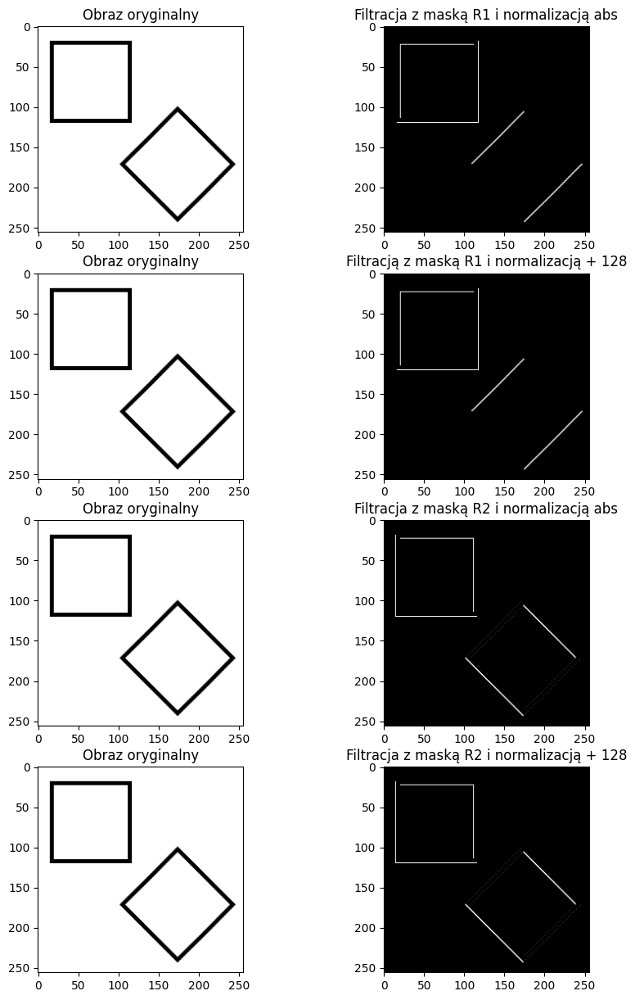

In [88]:
kw = cv2.imread('kw.png')
kw = cv2.cvtColor(kw, cv2.COLOR_BGR2GRAY)

R1 = np.array([[0, 0, 0], [-1, 0, 0], [0, 1, 0]], dtype=np.float32) / 9
R2 = np.array([[0, 0, 0,],[0, 0, -1], [0, 1, 0]], dtype=np.float32) / 9

kw_filtered_R1 = cv2.filter2D(kw, -1, R1)
kw_filtered_R2 = cv2.filter2D(kw, -1, R2)

kw_filtered_R1_abs = np.abs(kw_filtered_R1)
kw_filtered_R1_128 = kw_filtered_R1.astype('int16') + 128
#print(np.max(kw_filtered_R1_128))

kw_filtered_R2_abs = np.abs(kw_filtered_R2)
kw_filtered_R2_128 = kw_filtered_R2.astype('int16') + 128

results = [kw_filtered_R1_abs, kw_filtered_R1_128, kw_filtered_R2_abs, kw_filtered_R2_128]
titles = ['Filtracja z maską R1 i normalizacją abs', 'Filtracją z maską R1 i normalizacją + 128',
          'Filtracja z maską R2 i normalizacją abs', 'Filtracja z maską R2 i normalizacją + 128']

fig, ax = plt.subplots(4, 2, figsize=(10, 15))

for i, res in enumerate(results):
    ax[i][0].imshow(kw, cmap='grey')
    ax[i][0].set_title('Obraz oryginalny')

    ax[i][1].imshow(res, cmap='grey')
    ax[i][1].set_title(titles[i])

plt.show()

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

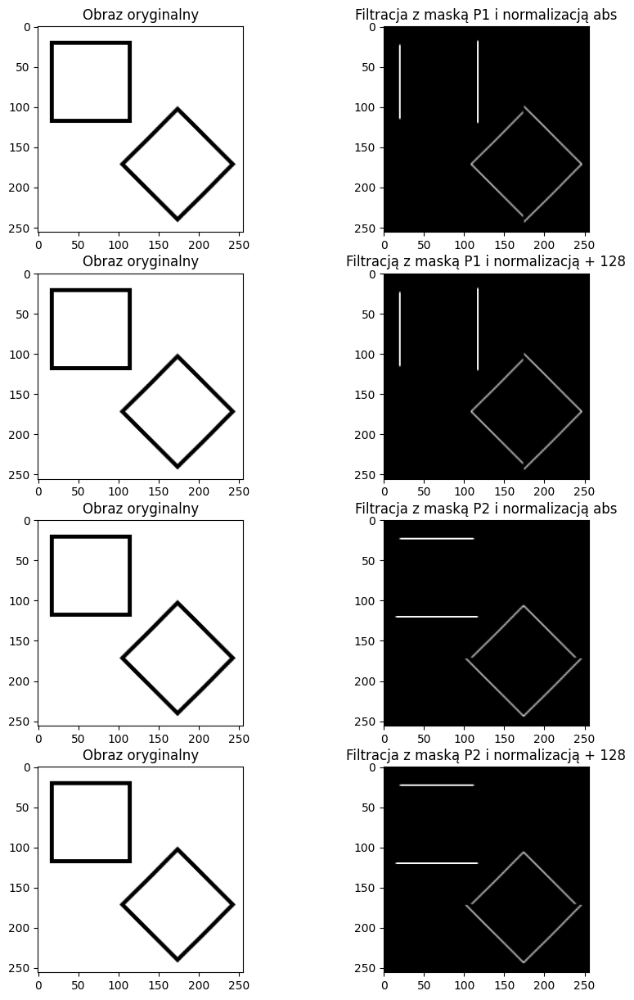

In [89]:
kw = cv2.imread('kw.png')
kw = cv2.cvtColor(kw, cv2.COLOR_BGR2GRAY)

P1 = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32) / 9
P2 = np.array([[-1, -1, -1,],[0, 0, 0], [1, 1, 1]], dtype=np.float32) / 9

kw_filtered_P1 = cv2.filter2D(kw, -1, P1)
kw_filtered_P2 = cv2.filter2D(kw, -1, P2)

kw_filtered_P1_abs = np.abs(kw_filtered_P1)
kw_filtered_P1_128 = kw_filtered_P1.astype('int16') + 128

kw_filtered_P2_abs = np.abs(kw_filtered_P2)
kw_filtered_P2_128 = kw_filtered_P2.astype('int16') + 128

results = [kw_filtered_P1_abs, kw_filtered_P1_128, kw_filtered_P2_abs, kw_filtered_P2_128]
titles = ['Filtracja z maską P1 i normalizacją abs', 'Filtracją z maską P1 i normalizacją + 128',
          'Filtracja z maską P2 i normalizacją abs', 'Filtracja z maską P2 i normalizacją + 128']

fig, ax = plt.subplots(4, 2, figsize=(10, 15))

for i, res in enumerate(results):
    ax[i][0].imshow(kw, cmap='grey')
    ax[i][0].set_title('Obraz oryginalny')

    ax[i][1].imshow(res, cmap='grey')
    ax[i][1].set_title(titles[i])

plt.show()

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

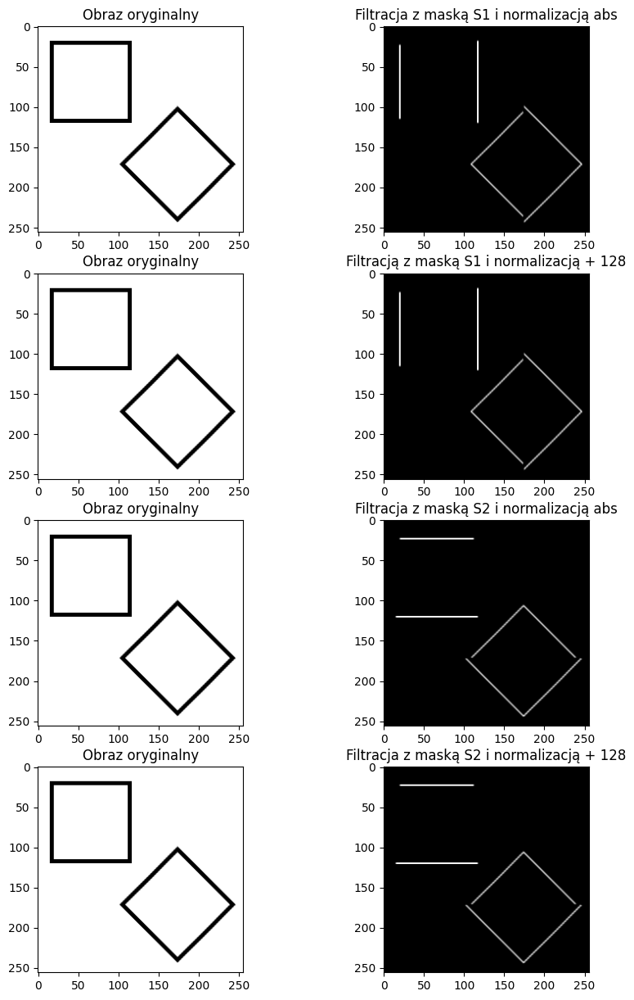

In [90]:
kw = cv2.imread('kw.png')
kw = cv2.cvtColor(kw, cv2.COLOR_BGR2GRAY)

S1 = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32) / 9
S2 = np.array([[-1, -2, -1,],[0, 0, 0], [1, 2, 1]], dtype=np.float32) / 9

kw_filtered_S1 = cv2.filter2D(kw, -1, S1)
kw_filtered_S2 = cv2.filter2D(kw, -1, S2)

kw_filtered_S1_abs = np.abs(kw_filtered_S1)
kw_filtered_S1_128 = kw_filtered_S1.astype('int16') + 128

kw_filtered_S2_abs = np.abs(kw_filtered_S2)
kw_filtered_S2_128 = kw_filtered_S2.astype('int16') + 128

results = [kw_filtered_S1_abs, kw_filtered_S1_128, kw_filtered_S2_abs, kw_filtered_S2_128]
titles = ['Filtracja z maską S1 i normalizacją abs', 'Filtracją z maską S1 i normalizacją + 128',
          'Filtracja z maską S2 i normalizacją abs', 'Filtracja z maską S2 i normalizacją + 128']

fig, ax = plt.subplots(4, 2, figsize=(10, 15))

for i, res in enumerate(results):
    ax[i][0].imshow(kw, cmap='grey')
    ax[i][0].set_title('Obraz oryginalny')

    ax[i][1].imshow(res, cmap='grey')
    ax[i][1].set_title(titles[i])

plt.show()

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



In [91]:
combined_sobel_sqrt = lambda O : np.sqrt(cv2.filter2D(O.astype('int16'), -1, S1) ** 2 + cv2.filter2D(O.astype('int16'), -1, S2) ** 2)

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

In [92]:
combined_sobel_abs = lambda O : np.abs(cv2.filter2D(O.astype('int16'), -1, S1)) + np.abs(cv2.filter2D(O.astype('int16'), -1, S2))

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

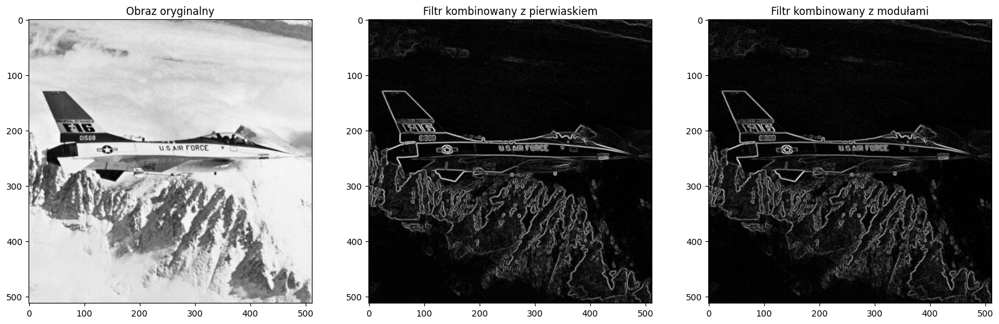

In [95]:
jet = cv2.imread('jet.png')
jet = cv2.cvtColor(jet, cv2.COLOR_BGR2GRAY)

jet_filtered_1 = combined_sobel_sqrt(jet)
jet_filtered_2 = combined_sobel_abs(jet)

fig, ax = plt.subplots(1, 3, figsize = (20, 15))

ax[0].imshow(jet, cmap='grey')
ax[0].set_title('Obraz oryginalny')

ax[1].imshow(jet_filtered_1, cmap='grey')
ax[1].set_title('Filtr kombinowany z pierwiaskiem')

ax[2].imshow(jet_filtered_2, cmap='grey')
ax[2].set_title('Filtr kombinowany z modułami')

plt.show()